this notebook has 3 parts of the analysis: Similarity analysis of the NRGDock resutls, Comparision of the NRGDock and Vina Scoring of the NRGDock generted list and Similarity analysis of NRDock and Vina generated lists

In [376]:
import sys
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Descriptors
from rdkit.Chem import AllChem
from rdkit import DataStructs
from rdkit.Chem import MACCSkeys
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from multiprocessing import Pool
import matplotlib.colors as mcolors
from scipy.stats import spearmanr
import requests

In [183]:
sph1 = pd.read_csv('RafiDataProcessing/top5000_SPH1_SMILES.csv')
sph1 = sph1.truncate(after=999)
sph1.sort_values(by=[' NRGDock Score'], ascending=True, inplace=True)
sph1.reset_index(drop=True, inplace = True)

In [184]:
sph2 = pd.read_csv('RafiDataProcessing/top5000_SPH2_SMILES.csv')
sph2 = sph2.truncate(after=999)
sph2.sort_values(by=[' NRGDock Score'], ascending=True, inplace=True)
sph2.reset_index(drop=True, inplace = True)

In [185]:
sph1.head()

,ID,NRGDock Score,smiles,idnumber,Type
0,Z1334416457,-2845434.75,O=C(NCC1=CC(OC2=CC=C(F)C(F)=C2)=CC=N1)C1=CC(=O...,Z1334416457,S
1,Z1987105697,-2832087.00,N#CC1=CC(N2C=CC(C(=O)NCC3=CC(OC4=CC=C(F)C(F)=C...,Z1987105697,S
2,Z2032639533,-2808982.50,NC(=O)CN(CC1=CC=C(C2=CC=CC=C2)C=C1)C(=O)C1=NN(...,Z2032639533,S
3,PV-007460487165,-2804440.00,O=C(NC1=CC=C(F)C(C2=CC=CC=C2)=C1)C1=NN(C2=CC=C...,PV-007460487165,S
4,Z4984250414,-2785337.25,COC1=CC(CCN(C)C(=O)C2=C(C3=CC=CC=C3)C(C3=CC=CC...,Z4984250414,M


In [186]:
sph2.head()

,ID,NRGDock Score,smiles,idnumber,Type
0,Z1952793669,-2840303.75,CC1=NC2=CC=CC=C2N(CCNC(=O)C2=CC(F)=C(F)C=C2C(=...,Z1952793669,S
1,Z1334416457,-2834104.50,O=C(NCC1=CC(OC2=CC=C(F)C(F)=C2)=CC=N1)C1=CC(=O...,Z1334416457,S
2,PV-009553125022,-2830321.00,O=C(NC1=NC(O)=CC=C1C1=CC=CC=C1)C1=CN(C2=CC(F)=...,PV-009553125022,M
3,PV-007460487165,-2826179.75,O=C(NC1=CC=C(F)C(C2=CC=CC=C2)=C1)C1=NN(C2=CC=C...,PV-007460487165,S
4,Z2032639533,-2809555.75,NC(=O)CN(CC1=CC=C(C2=CC=CC=C2)C=C1)C(=O)C1=NN(...,Z2032639533,S


# Similarity analysis of the NRGDock resutls

In [187]:
smiles_list_sph1 = sph1['smiles']
molecules_sph1 = [Chem.MolFromSmiles(smile) for smile in smiles_list_sph1]
fingerprints_sph1 = [AllChem.GetMorganFingerprintAsBitVect(mol, radius=3, nBits = 2048) for mol in molecules_sph1]

In [188]:
smiles_list_sph2 = sph2['smiles']
molecules_sph2 = [Chem.MolFromSmiles(smile) for smile in smiles_list_sph2]
fingerprints_sph2 = [AllChem.GetMorganFingerprintAsBitVect(mol, radius=3, nBits = 2048) for mol in molecules_sph2]

In [189]:
molecules_sph1 = [Chem.MolFromSmiles(smile) for smile in smiles_list_sph1]
mac_fingerprints_sph1 = [MACCSkeys.GenMACCSKeys(mol) for mol in molecules_sph1 if mol is not None]

In [190]:
molecules_sph2 = [Chem.MolFromSmiles(smile) for smile in smiles_list_sph2]
mac_fingerprints_sph2 = [MACCSkeys.GenMACCSKeys(mol) for mol in molecules_sph2 if mol is not None]

In [194]:
sph1['Morgan Fingerprints'] = fingerprints_sph1
sph2['Morgan Fingerprints'] = fingerprints_sph2
sph1['MACCS Fingerprints'] = mac_fingerprints_sph1 
sph2['MACCS Fingerprints'] = mac_fingerprints_sph2

In [195]:
print(len(sph1), len(sph2))

1000 1000


In [196]:
def pairwise_similarity(fingerprints_list1, fingerprints_list2):
    nfgrps1 = len(fingerprints_list1)
    nfgrps2 = len(fingerprints_list2)
    
    # The similarity matrix will have a shape of (nfgrps1, nfgrps2)
    similarities = np.zeros((nfgrps1, nfgrps2), dtype=float)

    for i in range(nfgrps1):
        for j in range(nfgrps2):
            similarity = DataStructs.TanimotoSimilarity(fingerprints_list1[i], fingerprints_list2[j])
            similarities[i, j] = similarity

    return similarities

In [197]:
similarities = pairwise_similarity(sph1['Morgan Fingerprints'],sph2['Morgan Fingerprints'])

In [262]:
maccs_similarities = pairwise_similarity(sph1['MACCS Fingerprints'],sph2['MACCS Fingerprints'])

In [199]:
sph1_self_similarities = pairwise_similarity(sph1['Morgan Fingerprints'],sph1['Morgan Fingerprints'])
sph2_self_similarities = pairwise_similarity(sph2['Morgan Fingerprints'],sph2['Morgan Fingerprints'])
sph1_self_maccs_similarities = pairwise_similarity(sph1['MACCS Fingerprints'],sph1['MACCS Fingerprints'])
sph2_self_maccs_similarities = pairwise_similarity(sph2['MACCS Fingerprints'],sph2['MACCS Fingerprints'])

In [260]:
def visualize_similarity_matrix(similarities, title='Heatmap of Similarity Matrix', figsize=(12, 10)):
    """
    Visualize the similarity matrix.

    Parameters:
    - similarities: A precomputed similarity matrix.
    - title: Title of the heatmap.
    """
    # Set the aesthetic style of the plots
    sns.set(style="white")

    # Create the heatmap with adjusted figure size for the dataset
    plt.figure(figsize=figsize)  # Adjust this based on your dataset size and output device

    # Generate a heatmap without annotations and with the custom color map
    ax = sns.heatmap(similarities, cmap='viridis', xticklabels=False, yticklabels=False,
                     cbar_kws={"shrink": .5}, square=True)

    # Set a title with a visible font size
    ax.set_title(title, fontsize=20)

    # Hide the axis labels to avoid clutter
    ax.set(xlabel=None, ylabel=None)

    # Turn off the axis ticks
    ax.tick_params(axis='both', which='both', length=0)

    # Display the plot
    plt.show()

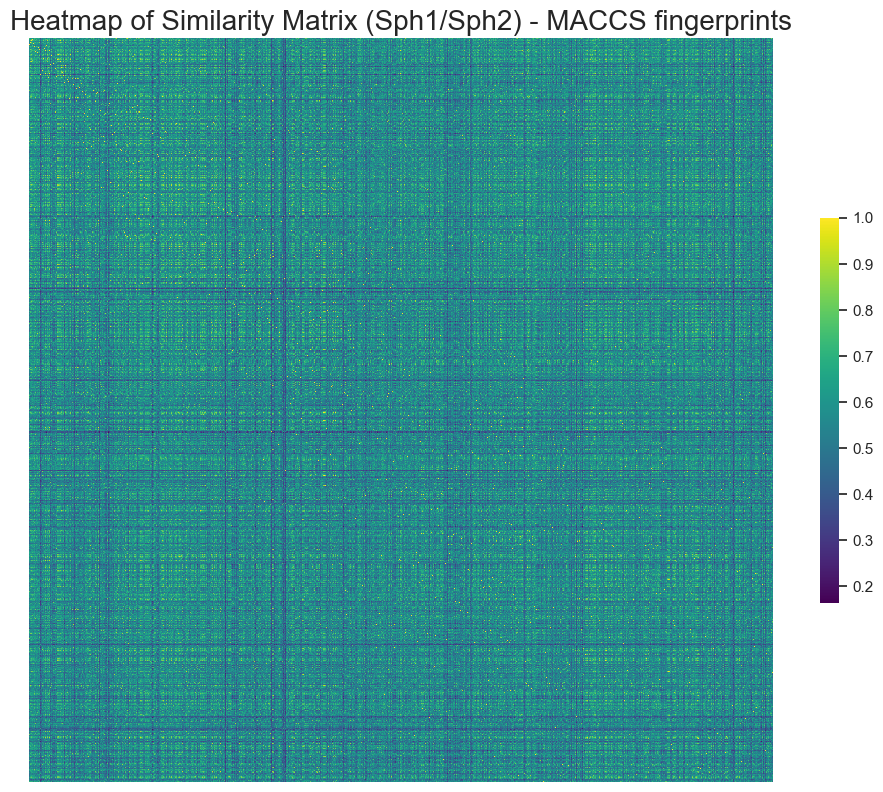

In [263]:
visualize_similarity_matrix(maccs_similarities, title='Heatmap of Similarity Matrix (Sph1/Sph2) - MACCS fingerprints')

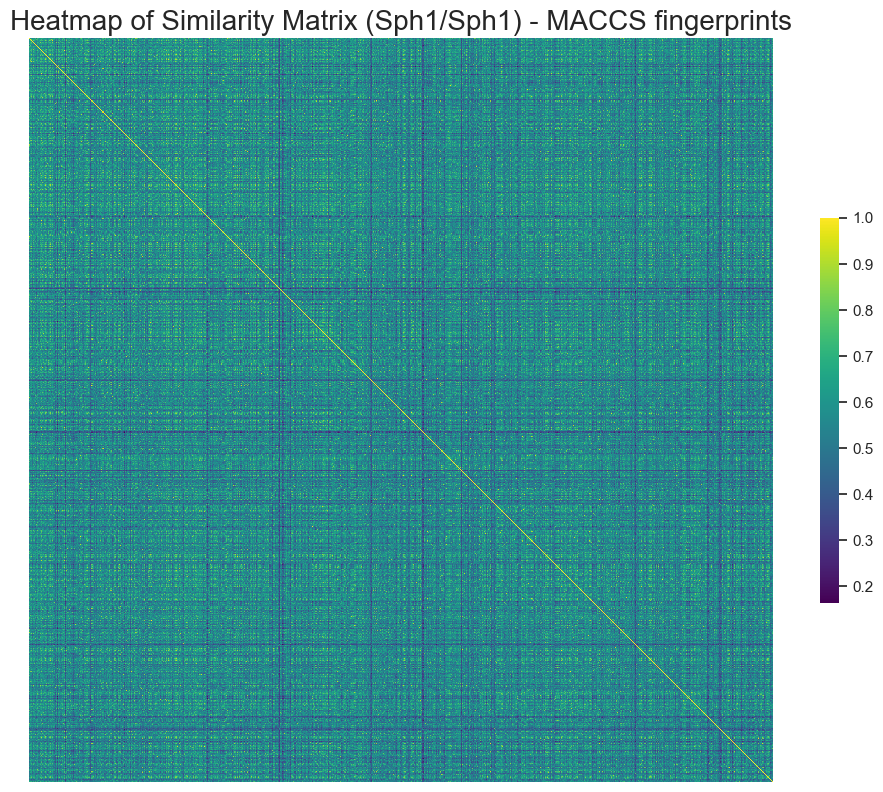

In [205]:
visualize_similarity_matrix(sph1_self_maccs_similarities, title='Heatmap of Similarity Matrix (Sph1/Sph1) - MACCS fingerprints')

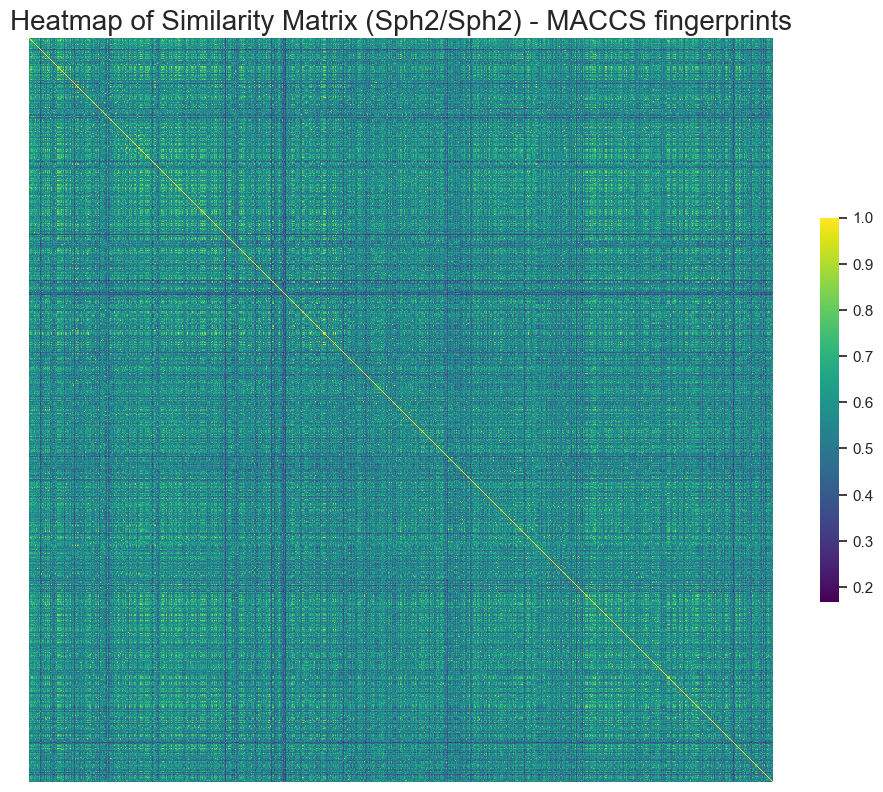

In [206]:
visualize_similarity_matrix(sph2_self_maccs_similarities, title='Heatmap of Similarity Matrix (Sph2/Sph2) - MACCS fingerprints')

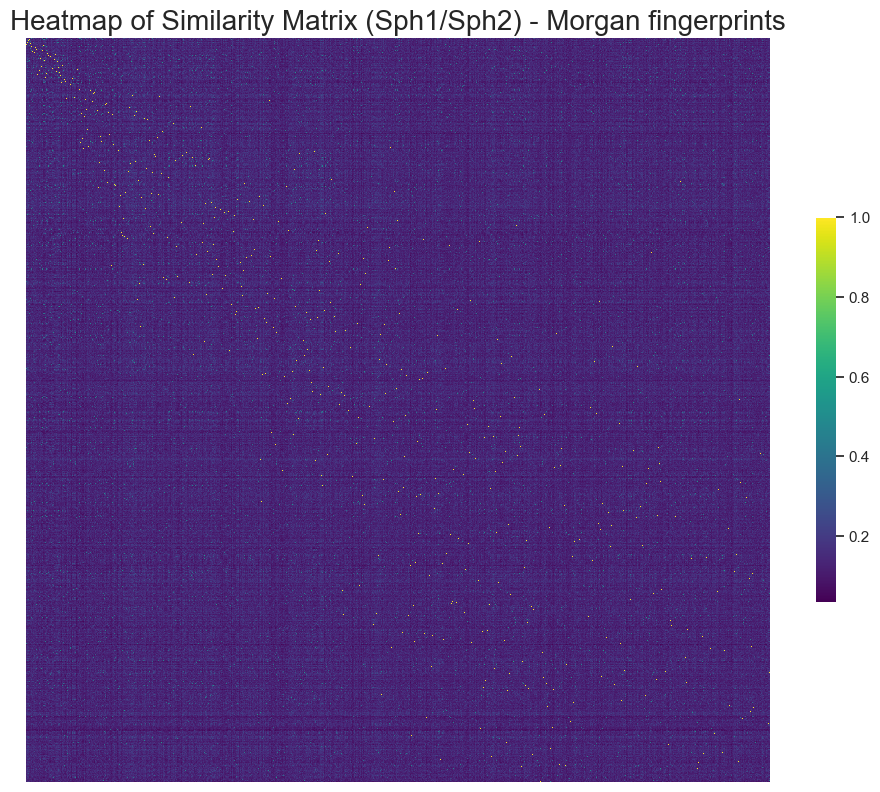

In [207]:
visualize_similarity_matrix(similarities, title='Heatmap of Similarity Matrix (Sph1/Sph2) - Morgan fingerprints')

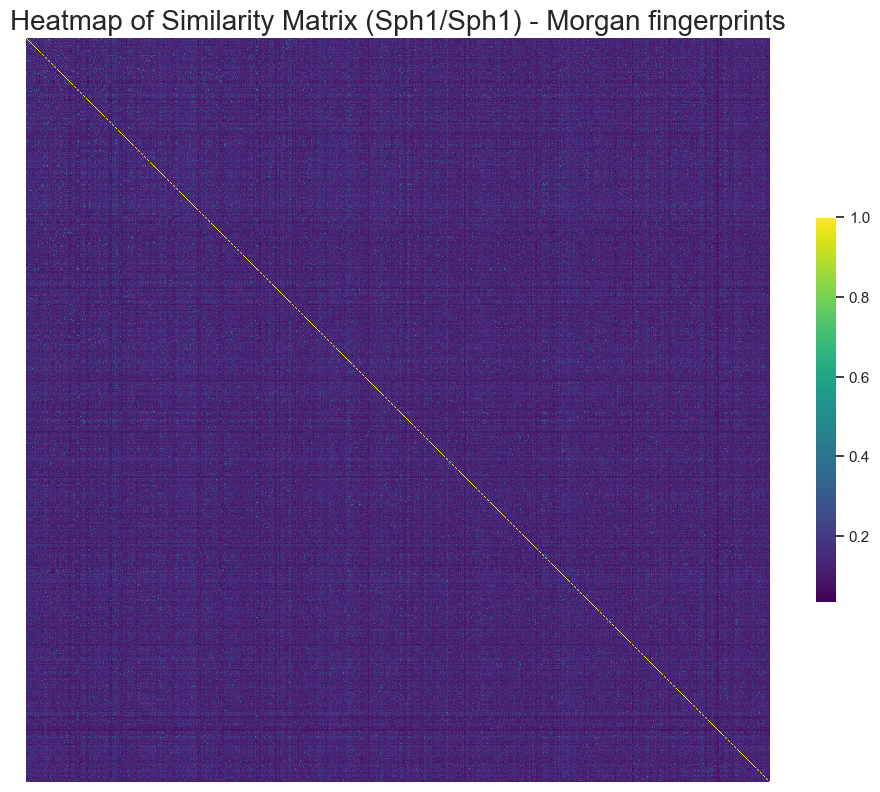

In [208]:
visualize_similarity_matrix(sph1_self_similarities, title='Heatmap of Similarity Matrix (Sph1/Sph1) - Morgan fingerprints')

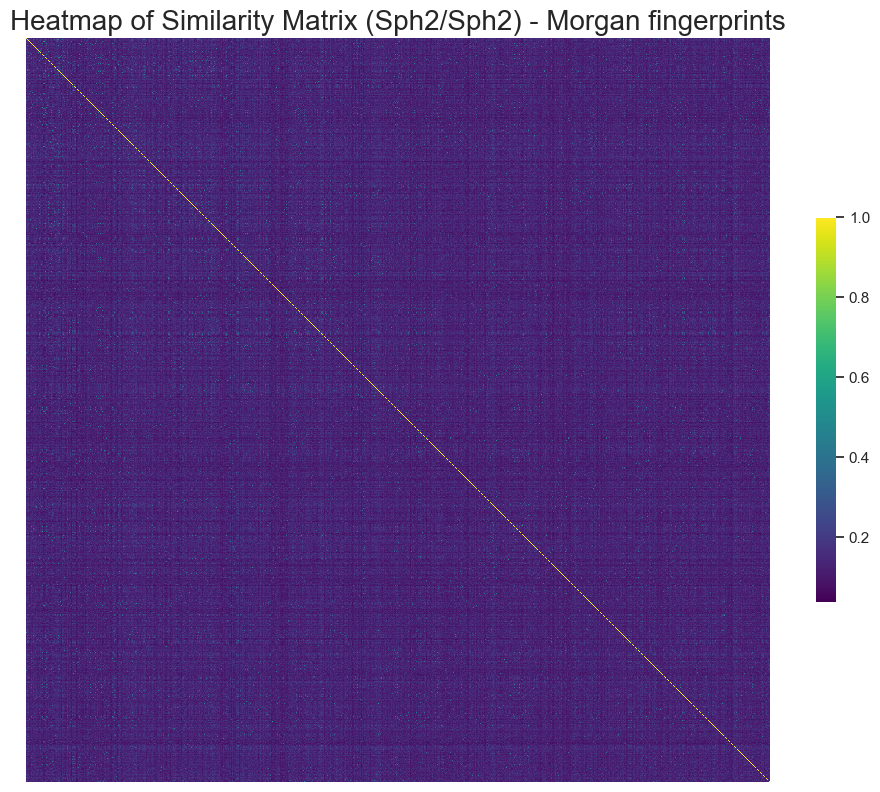

In [209]:
visualize_similarity_matrix(sph2_self_similarities, title='Heatmap of Similarity Matrix (Sph2/Sph2) - Morgan fingerprints')

In [210]:
def similarity_plot(size, DoLabels, labels1, labels2, similarities):
    sns.set(font_scale=1.0)  # Set the aesthetic style of the plots

    # Sample a smaller portion of the matrix if necessary
    sample_size1 = min(size, len(labels1))  # For dataset 1
    sample_size2 = min(size, len(labels2))  # For dataset 2
    smaller_matrix = similarities[:sample_size1, :sample_size2]
    smaller_labels1 = labels1[:sample_size1]
    smaller_labels2 = labels2[:sample_size2]

    # Set the aesthetic style of the plots
    sns.set(style="white")

    # Create the heatmap
    plt.figure(figsize=(12, 10))  # Adjust figure size for performance
    if DoLabels:
        plot = sns.heatmap(smaller_matrix, center=0, square=True, xticklabels=smaller_labels2, yticklabels=smaller_labels1, linewidths=.5, cbar_kws={"shrink": .5}, cmap='viridis')
    else: 
        plot = sns.heatmap(smaller_matrix, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, cmap='viridis')
    
    # Improve the appearance
    plt.title('Heatmap of Tanimoto Similarities', fontsize=20)
    plt.xticks(rotation=90)  # Rotate x labels for better readability
    plt.yticks(rotation=0)

    # Display the plot
    plt.show()

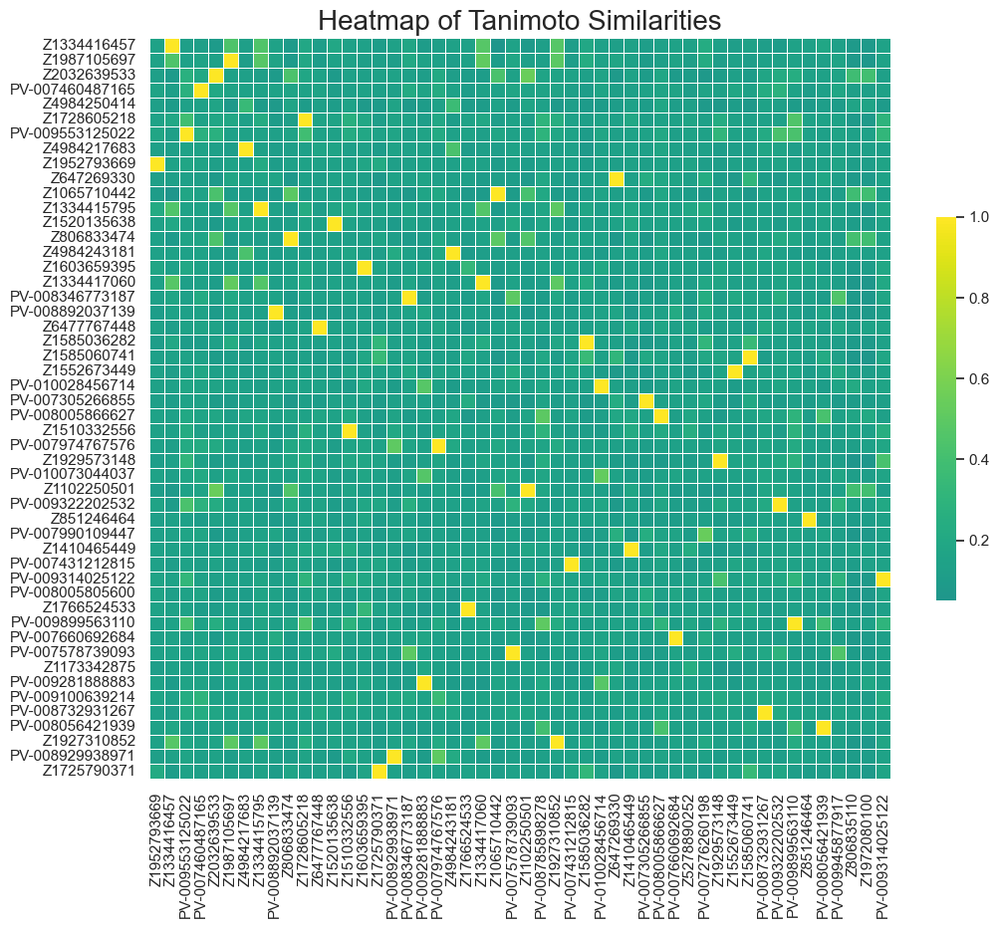

In [211]:
similarity_plot(50, True, sph1['ID'], sph2['ID'], similarities)

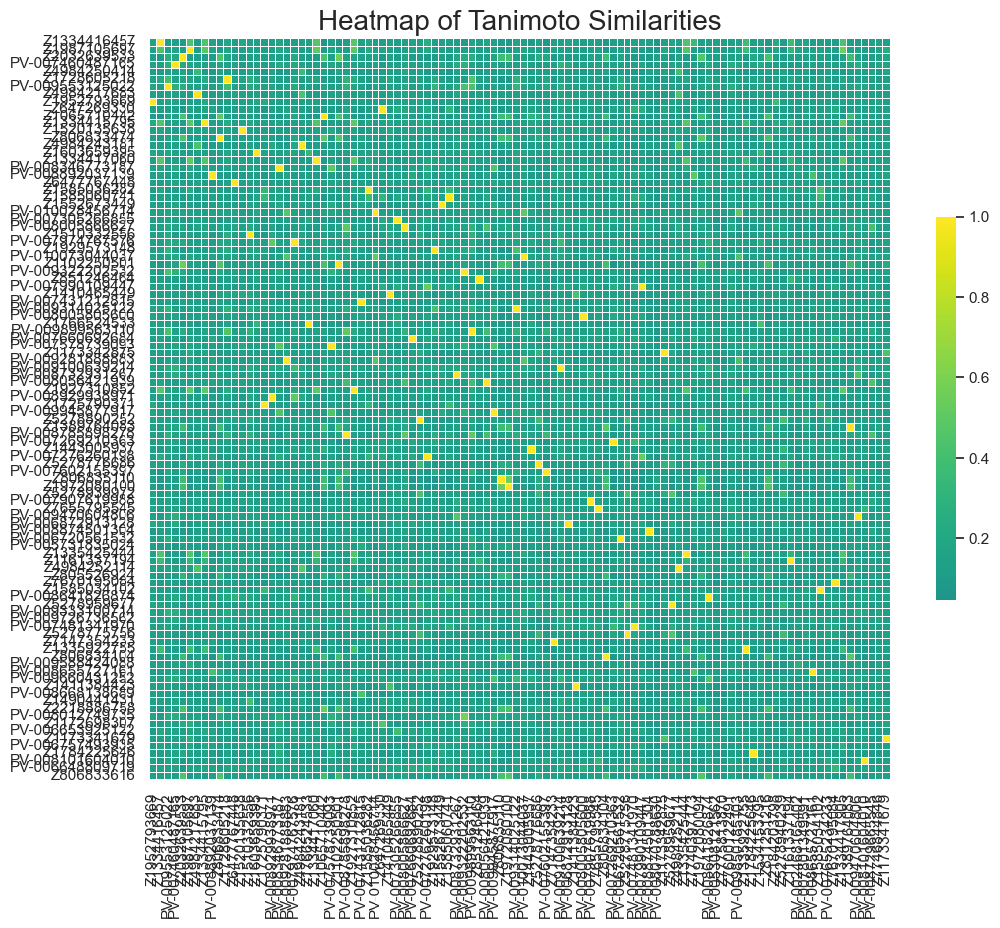

In [212]:
similarity_plot(100, True, sph1['ID'], sph2['ID'], similarities)

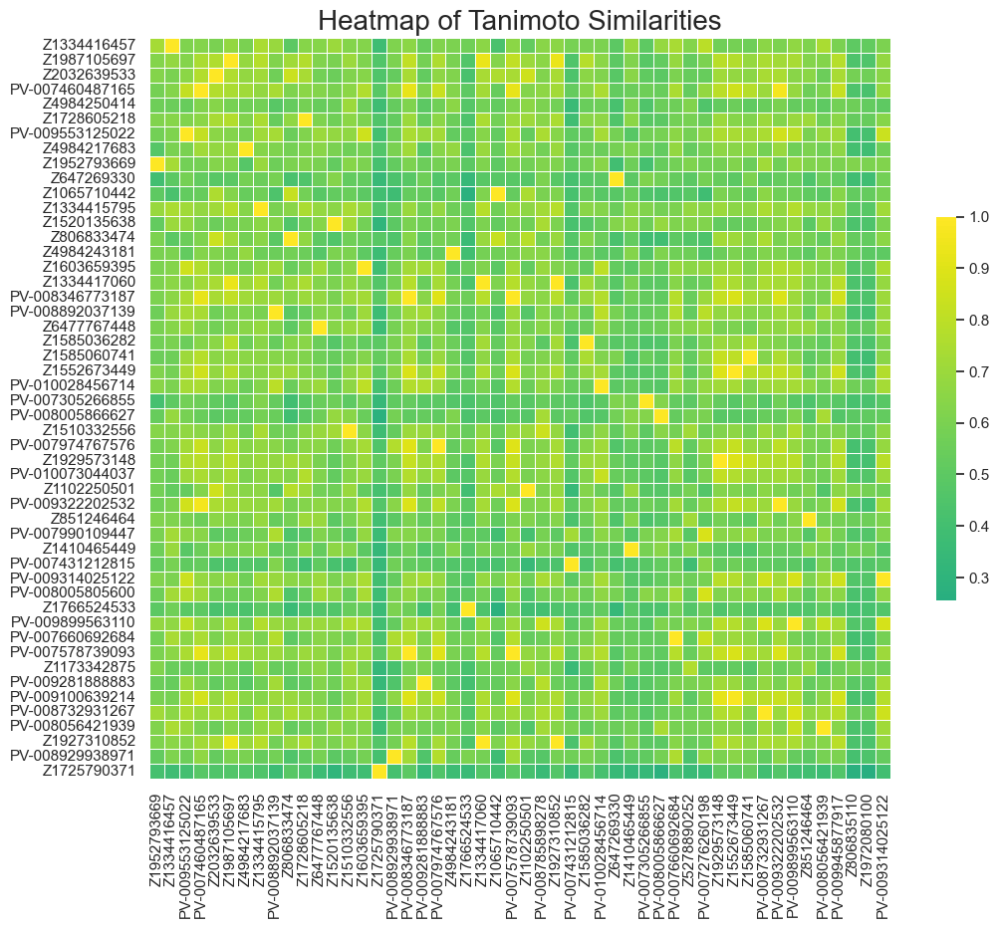

In [213]:
similarity_plot(50, True, sph1['ID'], sph2['ID'], maccs_similarities)

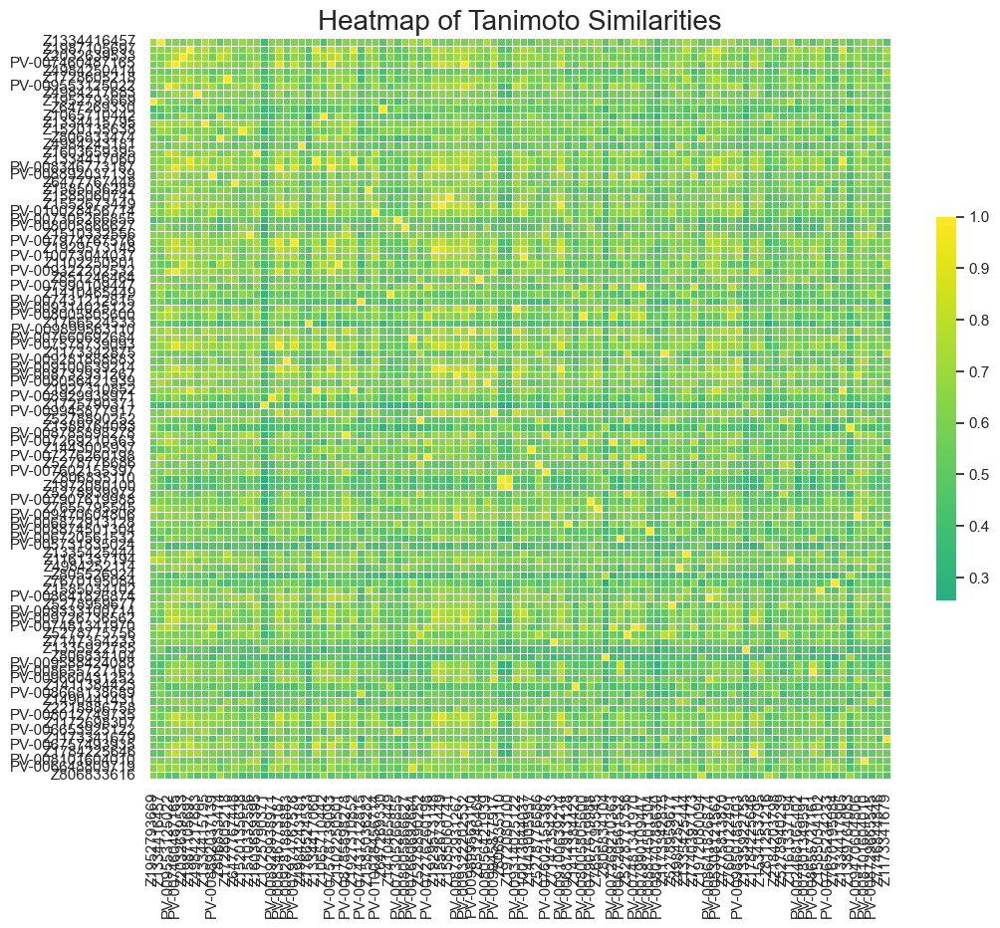

In [214]:
similarity_plot(100, True, sph1['ID'], sph2['ID'], maccs_similarities)

# Comparision of the NRGDock and Vina Scoring of the NRGDock generted list

In [248]:
sph1_rescored = pd.read_csv('Data/results/rafi/sph1/results_sph1.csv')
sph2_rescored = pd.read_csv('Data/results/rafi/sph2/results_sph2.csv')

In [216]:
sph1_rescored['Rank_Approach_1'] = sph1_rescored['mean'].rank(method='first')
sph1['Rank_Approach_2'] = sph1[' NRGDock Score'].rank(method='first')

In [217]:
sph2_rescored['Rank_Approach_1'] = sph2_rescored['mean'].rank(method='first')
sph2['Rank_Approach_2'] = sph2[' NRGDock Score'].rank(method='first')

In [218]:
sph1_rescored.head()

,SMILES,proteinID,ligandID,mean,median,max,min,var,Rank_Approach_1
0,O=C(NC1=C(F)C(C2=CC=NC=C2)=CC=C1)C1=NC(C2=CC=C...,7RDY-no-extra,177,-9.184091,-9.15,-8.5,-9.8,0.355788,1.0
1,O=C(CC1=NOC(C2=CC=CC(C3=NNC(=O)C=C3)=C2)=N1)NC...,7RDY-no-extra,967,-9.020455,-9.05,-8.4,-9.3,0.085851,2.0
2,COC1=CC=C(NC(=O)C2=NN=C(C3=CC=CC=N3)N2)C=C1C(=...,7RDY-no-extra,28,-8.954545,-9.05,-7.6,-9.8,0.585793,3.0
3,O=C(NC1=CC=C2C(=O)NC(=O)NC2=N1)C1=CC(C2=C(F)C=...,7RDY-no-extra,15,-8.931818,-8.95,-7.7,-9.4,0.238499,4.0
4,CC1=CC(C(=O)OCC2=NC=C(C3=CC=CC(C4=CC=CC=C4)=C3...,7RDY-no-extra,481,-8.922727,-9.05,-8.0,-9.5,0.263658,5.0


In [219]:
sph1.head()

,ID,NRGDock Score,smiles,idnumber,Type,Morgan Fingerprints,MACCS Fingerprints,Rank_Approach_2
0,Z1334416457,-2845434.75,O=C(NCC1=CC(OC2=CC=C(F)C(F)=C2)=CC=N1)C1=CC(=O...,Z1334416457,S,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1.0
1,Z1987105697,-2832087.00,N#CC1=CC(N2C=CC(C(=O)NCC3=CC(OC4=CC=C(F)C(F)=C...,Z1987105697,S,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",2.0
2,Z2032639533,-2808982.50,NC(=O)CN(CC1=CC=C(C2=CC=CC=C2)C=C1)C(=O)C1=NN(...,Z2032639533,S,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",3.0
3,PV-007460487165,-2804440.00,O=C(NC1=CC=C(F)C(C2=CC=CC=C2)=C1)C1=NN(C2=CC=C...,PV-007460487165,S,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",4.0
4,Z4984250414,-2785337.25,COC1=CC(CCN(C)C(=O)C2=C(C3=CC=CC=C3)C(C3=CC=CC...,Z4984250414,M,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",5.0


In [220]:
sph1_merged = pd.merge(sph1_rescored, sph1, left_on='SMILES', right_on='smiles')
sph2_merged = pd.merge(sph2_rescored, sph2, left_on='SMILES', right_on='smiles')

In [221]:
sph1_merged.count()

SMILES                 998
proteinID              998
ligandID               998
mean                   998
median                 998
max                    998
min                    998
var                    998
Rank_Approach_1        998
ID                     998
 NRGDock Score         998
smiles                 998
idnumber               998
Type                   998
Morgan Fingerprints    998
MACCS Fingerprints     998
Rank_Approach_2        998
dtype: int64

In [222]:
sph1_merged['Ranking_Difference'] = abs(sph1_merged['Rank_Approach_1'] - sph1_merged['Rank_Approach_2'])
sph2_merged['Ranking_Difference'] = abs(sph2_merged['Rank_Approach_1'] - sph2_merged['Rank_Approach_2'])

In [223]:
def hist(merged_df):
    # Histogram/Boxplot for Ranking Differences
    plt.figure(figsize=(10, 6))
    sns.histplot(merged_df['Ranking_Difference'], bins=40, kde=True, color='blue', edgecolor='black', alpha=0.7)
    plt.title('Distribution of Ranking Differences')
    plt.xlabel('Ranking Difference')
    plt.ylabel('Frequency')
    plt.show()

/Users/faflik/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


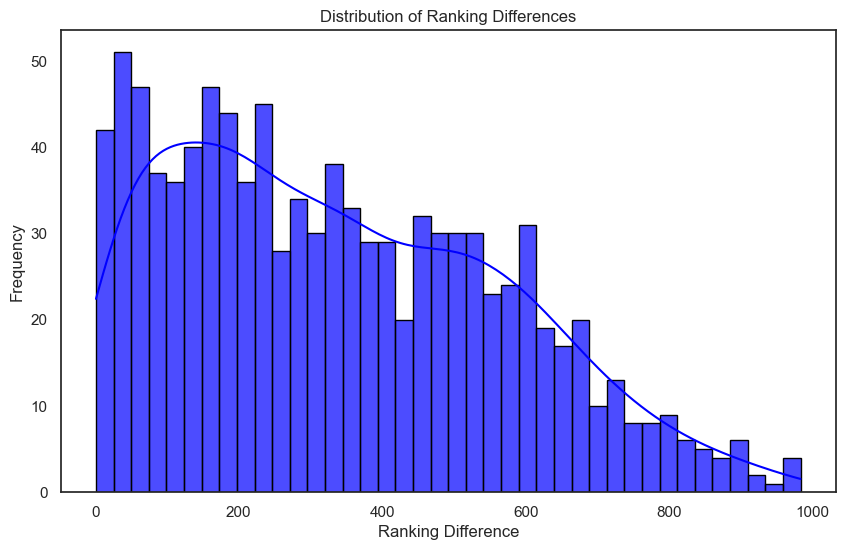

In [224]:
hist(sph1_merged)

/Users/faflik/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


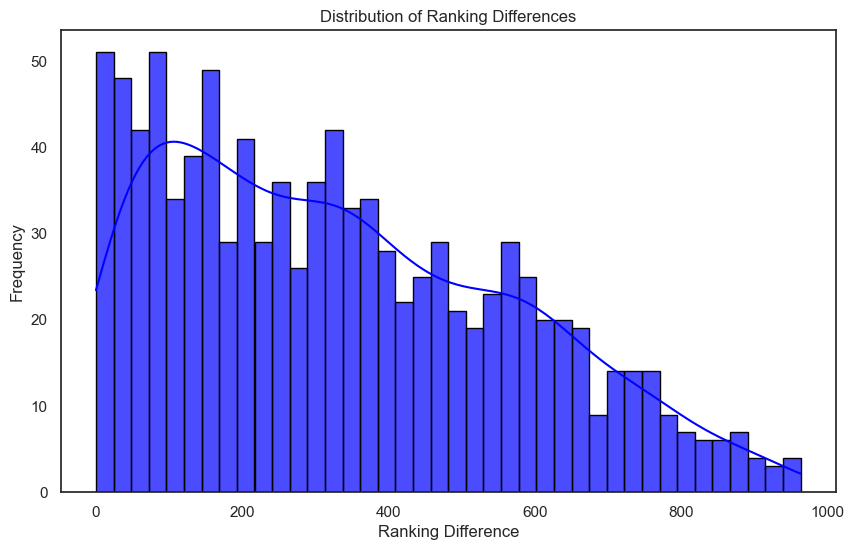

In [225]:
hist(sph2_merged)

In [227]:
sph1_merged['Ranking_Difference'].describe()

count    998.000000
mean     336.735471
std      228.981422
min        1.000000
25%      144.500000
50%      304.000000
75%      507.000000
max      983.000000
Name: Ranking_Difference, dtype: float64

In [228]:
sph2_merged['Ranking_Difference'].describe()

count    997.000000
mean     334.572718
std      235.193337
min        0.000000
25%      135.000000
50%      302.000000
75%      508.000000
max      963.000000
Name: Ranking_Difference, dtype: float64

In [237]:
def Scatter(merged_df):
    # Scatter Plot
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='Rank_Approach_1', y='Rank_Approach_2', data=merged_df)
    plt.title('Comparison of Drug Docking Approaches')
    plt.xlabel('Vina Score (Approach 1)')
    plt.ylabel('NRGDock Score (Approach 2)')
    plt.show()

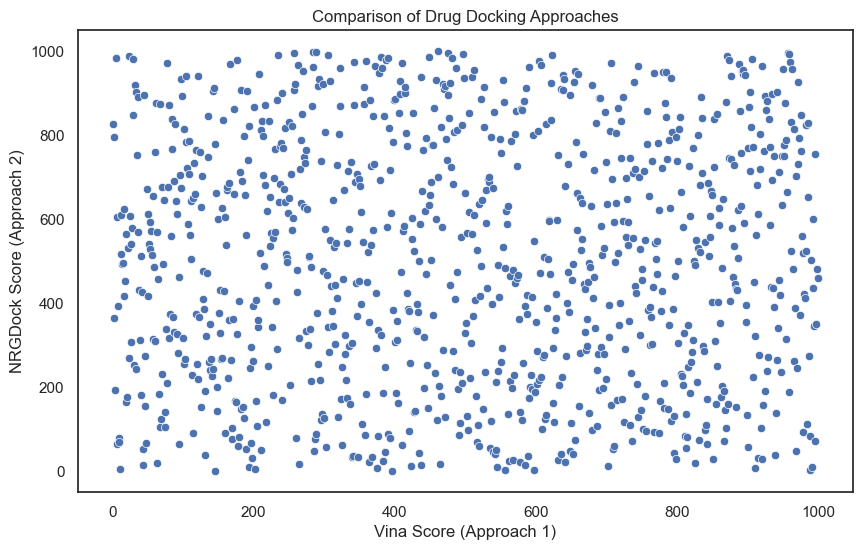

In [238]:
Scatter(sph1_merged)

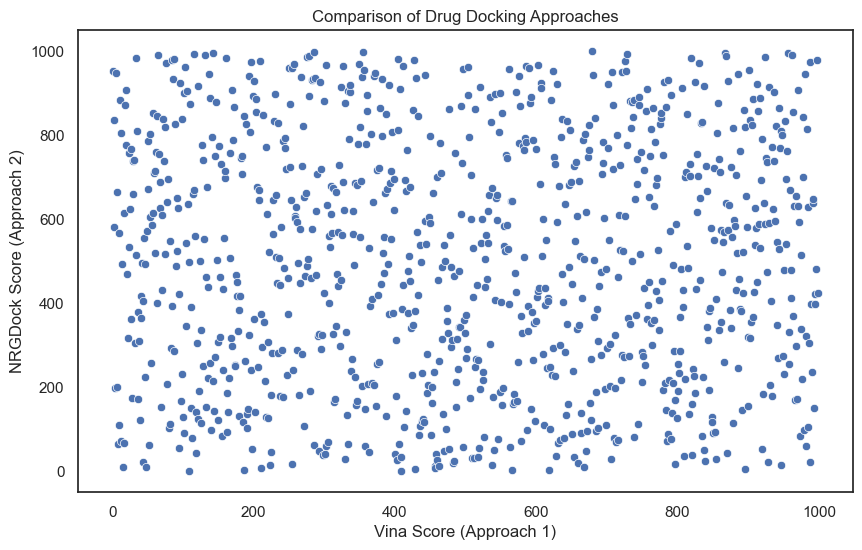

In [239]:
Scatter(sph2_merged)

In [242]:
def correlation(merged_df):
    # Calculate Spearman's rank correlation
    correlation, p_value = spearmanr(merged_df['Rank_Approach_1'], merged_df['Rank_Approach_2'])
    
    print(f"Spearman's rank correlation coefficient: {correlation:.3f}")
    print(f"P-value: {p_value:.3f}")

# Interpret the results
# A correlation close to 1 indicates a strong positive relationship,
# close to -1 indicates a strong negative relationship,
# and around 0 indicates no relationship.

In [246]:
correlation(sph1_merged)

Spearman's rank correlation coefficient: 0.005
P-value: 0.886


In [247]:
correlation(sph2_merged)

Spearman's rank correlation coefficient: -0.005
P-value: 0.863


# Similarity analysis of NRDock and Vina generated lists

will be done only with MACCS fingerprints since they work better

In [253]:
top100 = pd.read_csv('Conversion/SdfToSmiles/output_smiles.csv')
top100 = top100.truncate(after=99)
composite = pd.read_csv('Data/results/rafi/unified/unified_results_rafi.csv')

In [250]:
top100.head()

,LigandID,SMILES
0,Mrv1909-10091921542D,C[C@@]1(CO)[C@H]([C@@H](C[C@]2([C@H]1[C@@H](C[...
1,Mrv0541-02231214492D,C12(CCN(CC1)CC(C)C)N=C1c3c4c(c(c5c3C(=O)[C@@](...
2,Mrv1909-08181923252D,C1([C@H]([C@H]([C@@H]([C@H](O1)C)O)N)O)OC1CC(C...
3,Mrv0541-02231215192D,c12c3c4C(=O)[C@@](O/C=C/[C@@H]([C@H]([C@H]([C@...
4,Mrv0541-02231215202D,[C@@H]1([C@H]([C@H](OC(=O)C)[C@@H]([C@@H](OC)/...


In [276]:
composite.head()

,SMILES,proteinID,ligandID,mean,median,max,min,var,MACCS Fingerprints
0,COC1=CC=C(C2=CC=NC=C2)C=C1C1=CC=C(C(=O)CC2=NNC...,7RDY-zinc,4,-8.829545,-9.15,-7.4,-9.3,0.301876,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,O=C(NCC1=CC=C(NC(=O)C2=CC=CN=C2)C=C1)C1=CC=C2C...,7RDY-no-extra,280,-8.751136,-8.90,-7.6,-9.1,0.145286,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,CC1=C(C2=CC=CC=C2)C=C(C(=O)NCC2=NOC(C3=CC=C(F)...,7RDY-zinc,132,-8.715909,-8.50,-7.4,-9.4,0.156985,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,O=C(NC1=CC(C2=NNN=N2)=CC(C2=CC=NC=C2)=C1)C1=C(...,7RDY-no-extra,359,-8.642045,-8.65,-8.3,-9.0,0.067982,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,O=C(NC1=CC=CC(NC(=O)C2=CC3=CN=CC=C3C=C2F)=C1)C...,7RDY-zinc,446,-8.626136,-8.60,-7.7,-9.4,0.181723,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [255]:
smiles_list_top100 = top100['SMILES']
molecules_top100 = [Chem.MolFromSmiles(smile) for smile in smiles_list_top100]
mac_fingerprints_top100 = [MACCSkeys.GenMACCSKeys(mol) for mol in molecules_top100 if mol is not None]
top100['MACCS Fingerprints'] = mac_fingerprints_top100 

In [256]:
smiles_list_composite = composite['SMILES']
molecules_composite = [Chem.MolFromSmiles(smile) for smile in smiles_list_composite]
mac_fingerprints_composite = [MACCSkeys.GenMACCSKeys(mol) for mol in molecules_composite if mol is not None]
composite['MACCS Fingerprints'] = mac_fingerprints_composite

In [258]:
vina_maccs_similarities = pairwise_similarity(top100['MACCS Fingerprints'],composite['MACCS Fingerprints'])

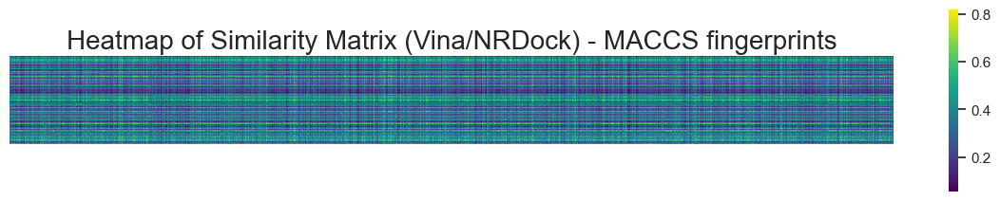

In [271]:
visualize_similarity_matrix(vina_maccs_similarities, title='Heatmap of Similarity Matrix (Vina/NRDock) - MACCS fingerprints', figsize = (15,5))

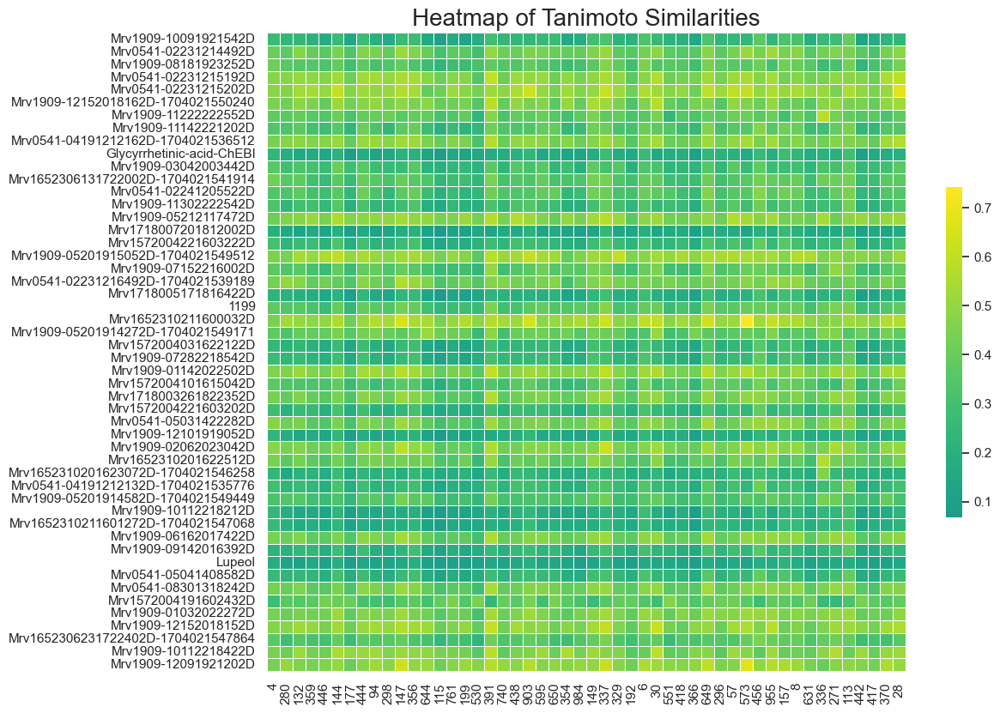

In [282]:
similarity_plot(50, True, top100['LigandID'], composite['ligandID'], vina_maccs_similarities)

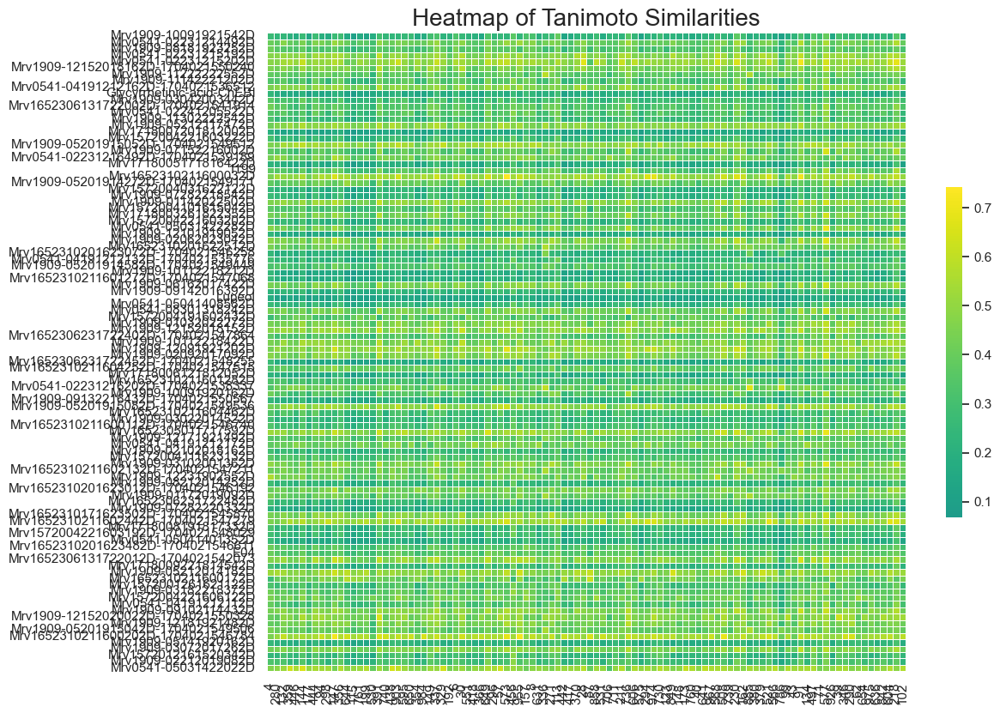

In [283]:
similarity_plot(100, True, top100['LigandID'], composite['ligandID'], vina_maccs_similarities)

In [289]:
mean_similarities = []
for x in vina_maccs_similarities:
    mean_similarities.append(np.mean(x))

In [290]:
max(mean_similarities)

0.5570515877899819

In [291]:
mean_similarities.index(0.5570515877899819)

94

In [292]:
top100['SMILES'][94]

'c1cc2c(nc1)NC(=O)[C@]12Cc2ccc(cc2C1)NC(=O)CN1[C@@H](CNC2(C1=O)CCCC2)c1cc(cc(c1)F)F'

In [296]:
top100_info = pd.read_csv('Data/results/repurposing/7RDY/updated_repurposing_result.csv')
top100_info.keys()

Index(['proteinID', 'ligandID', 'mean', 'median', 'max', 'min', 'var',
       'DATABASE_ID', 'DATABASE_NAME', 'SMILES', 'INCHI_IDENTIFIER',
       'INCHI_KEY', 'FORMULA', 'MOLECULAR_WEIGHT', 'EXACT_MASS',
       'JCHEM_ACCEPTOR_COUNT', 'JCHEM_ATOM_COUNT',
       'JCHEM_AVERAGE_POLARIZABILITY', 'JCHEM_BIOAVAILABILITY',
       'JCHEM_DONOR_COUNT', 'JCHEM_FORMAL_CHARGE', 'JCHEM_GHOSE_FILTER',
       'JCHEM_IUPAC', 'ALOGPS_LOGP', 'JCHEM_LOGP', 'ALOGPS_LOGS',
       'JCHEM_MDDR_LIKE_RULE', 'JCHEM_NUMBER_OF_RINGS',
       'JCHEM_PHYSIOLOGICAL_CHARGE', 'JCHEM_PKA', 'JCHEM_PKA_STRONGEST_ACIDIC',
       'JCHEM_PKA_STRONGEST_BASIC', 'JCHEM_POLAR_SURFACE_AREA',
       'JCHEM_REFRACTIVITY', 'JCHEM_ROTATABLE_BOND_COUNT',
       'JCHEM_RULE_OF_FIVE', 'ALOGPS_SOLUBILITY', 'JCHEM_TRADITIONAL_IUPAC',
       'JCHEM_VEBER_RULE', 'DRUGBANK_ID', 'DRUG_GROUPS', 'GENERIC_NAME',
       'SYNONYMS', 'PRODUCTS', 'JCHEM_AVERAGE_NEUTRAL_MICROSPECIES_CHARGE',
       'JCHEM_NEUTRAL_CHARGE', 'SECONDARY_ACCESSION_NUMB

In [298]:
top100_info['DRUGBANK_ID'][94]

'DB12424'

In [299]:
sph1_full = pd.read_csv('RafiDataProcessing/top5000_SPH1_SMILES.csv')

In [301]:
smiles_list_full = sph1_full['smiles']
molecules_full = [Chem.MolFromSmiles(smile) for smile in smiles_list_full]
mac_fingerprints_full = [MACCSkeys.GenMACCSKeys(mol) for mol in molecules_full if mol is not None]
sph1_full['MACCS Fingerprints'] = mac_fingerprints_full

In [303]:
full_vina_maccs_similarities = pairwise_similarity(top100['MACCS Fingerprints'], sph1_full['MACCS Fingerprints'])

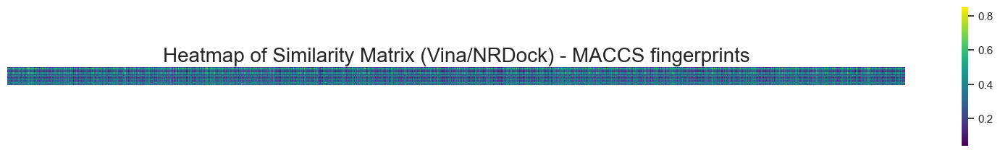

In [305]:
visualize_similarity_matrix(full_vina_maccs_similarities, title='Heatmap of Similarity Matrix (Vina/NRDock) - MACCS fingerprints', figsize = (20,5))

In [319]:
sph1_full_mean_similarities = []
for x in full_vina_maccs_similarities:
    sph1_full_mean_similarities.append(np.mean(x))

In [334]:
max(sph1_full_mean_similarities)

0.5561914205620929

In [335]:
sph1_full_mean_similarities.index(0.5561914205620929)

94

In [328]:
def hist(list):
    # Histogram/Boxplot for Ranking Differences
    plt.figure(figsize=(10, 6))
    sns.histplot(list, bins=50, kde=True, color='blue', edgecolor='black', alpha=0.7)
    plt.title('Distribution of Ranking Differences')
    plt.xlabel('Ranking Difference')
    plt.ylabel('Frequency')
    plt.show()

/Users/faflik/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


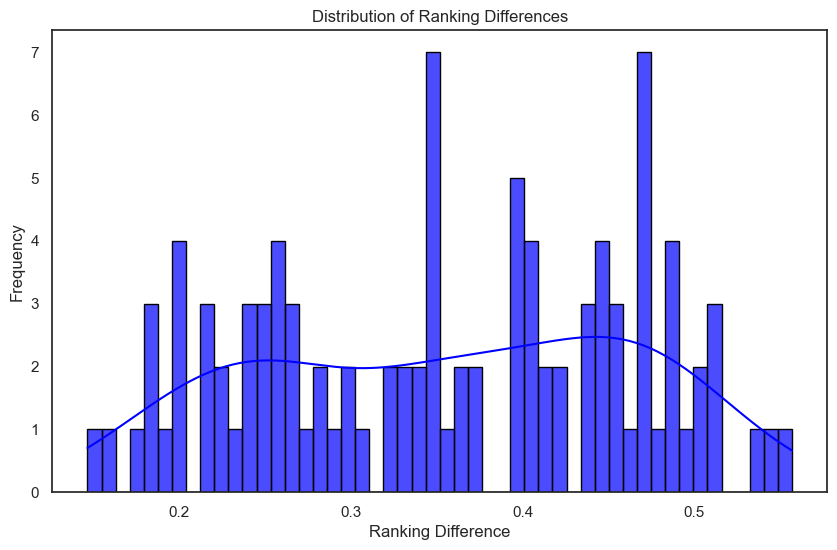

In [329]:
hist(mean_similarities)

/Users/faflik/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


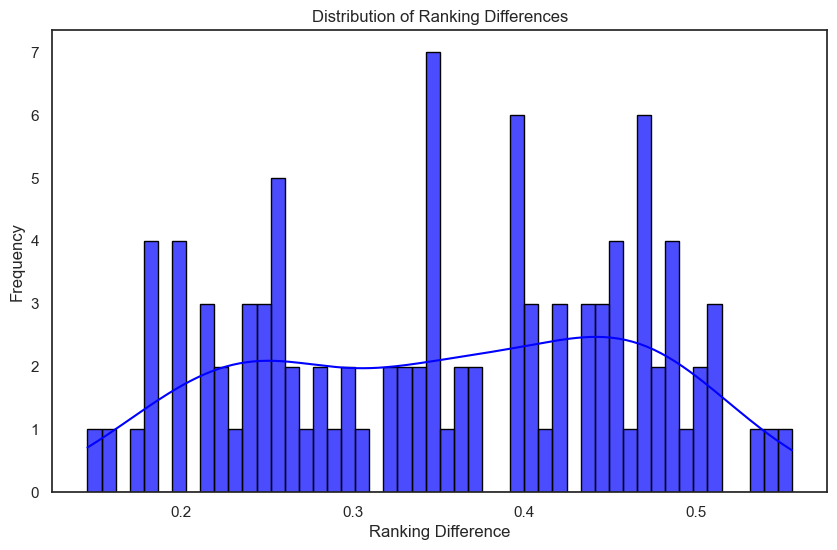

In [330]:
hist(sph1_full_mean_similarities)

In [337]:
bests = [] 
for x in sph1_full_mean_similarities:
    if x > 0.5: 
        bests.append(sph1_full_mean_similarities.index(x))

In [338]:
len(bests)

8

In [340]:
for x in bests:
    print(top100_info['DRUGBANK_ID'][x])

DB01220
DB12352
DB02729
DB15291
DB06595
DB12854
DB15688
DB12424


In [359]:
sph1_full_column_similarities = []

for x in range(5000):
    working = []
    for y in range(100):
        working.append(full_vina_maccs_similarities[y][x])
    sph1_full_column_similarities.append(np.mean(working))
    

In [361]:
len(sph1_full_column_similarities)

5000

/Users/faflik/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


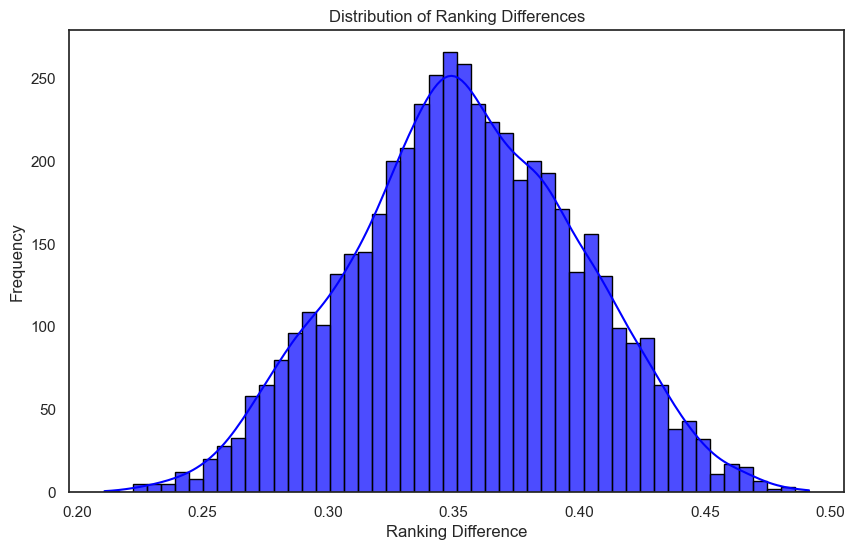

In [362]:
hist(sph1_full_column_similarities)

In [372]:
best_columns = [] 
for x in sph1_full_column_similarities:
    if x > 0.47: 
        best_columns.append(sph1_full_column_similarities.index(x))

In [373]:
len(best_columns)

11

In [374]:
best_columns

[577, 2605, 2748, 3217, 3248, 4379, 4640, 4641, 4679, 4713, 4778]

### CHEESE API moleculer property prediction

In [378]:
queries = []
for x in best_columns:
    queries.append(sph1_full['smiles'][x])

In [379]:
#API key
api_key="eyJhbGciOiJSUzI1NiIsInR5cCIgOiAiSldUIiwia2lkIiA6ICJmQ1FiTEJPN0huOXZEdWdCWm9vMkdBcjNmWFN6SWFZeVdYYnZSems3TzlNIn0.eyJleHAiOjE3Mzc3NjA4NTYsImlhdCI6MTcwNjIyNDg1NiwiYXV0aF90aW1lIjoxNzA2MjI0ODU2LCJqdGkiOiIxYWQ1MTdhNC01ZGMxLTRjNjQtODZmZS0xMmM5NWRjMWEzMGQiLCJpc3MiOiJodHRwczovL2xvZ2luLnRoZW1hbWEuYWkvYXV0aC9yZWFsbXMvY2hlZXNlIiwiYXVkIjpbImNoZWVzZS1hcGkiLCJhY2NvdW50Il0sInN1YiI6ImRiMmUyMjlkLTY2YmUtNGVhNC04NDgzLWVhNWM0OGU1N2ZmZCIsInR5cCI6IkJlYXJlciIsImF6cCI6ImNoZWVzZS1hcHAiLCJzZXNzaW9uX3N0YXRlIjoiNzFkZjVkZGYtMmU4NC00ZWUxLTk2YzAtMjMwZGZjN2Q1ODliIiwiYWNyIjoiMSIsImFsbG93ZWQtb3JpZ2lucyI6WyJodHRwczovL2NoZWVzZS50aGVtYW1hLmFpIl0sInJlYWxtX2FjY2VzcyI6eyJyb2xlcyI6WyJvZmZsaW5lX2FjY2VzcyIsImRlZmF1bHQtcm9sZXMtY2hlZXNlIiwiZnJlZW1pdW0iLCJ1bWFfYXV0aG9yaXphdGlvbiJdfSwicmVzb3VyY2VfYWNjZXNzIjp7ImNoZWVzZS1hcGkiOnsicm9sZXMiOlsiY2hlZXNlLWFwaS1hY2Nlc3MiXX0sImFjY291bnQiOnsicm9sZXMiOlsibWFuYWdlLWFjY291bnQiLCJtYW5hZ2UtYWNjb3VudC1saW5rcyIsInZpZXctcHJvZmlsZSJdfX0sInNjb3BlIjoib3BlbmlkIHByb2ZpbGUgZW1haWwgcm9sZXNfcmVhbG0iLCJzaWQiOiI3MWRmNWRkZi0yZTg0LTRlZTEtOTZjMC0yMzBkZmM3ZDU4OWIiLCJlbWFpbF92ZXJpZmllZCI6dHJ1ZSwibmFtZSI6IkphbiBGYWZsw61rIiwicHJlZmVycmVkX3VzZXJuYW1lIjoiaG9uemFmYWZhIiwiZ2l2ZW5fbmFtZSI6IkphbiIsImZhbWlseV9uYW1lIjoiRmFmbMOtayIsImVtYWlsIjoiaG9uemFmYWZhMTdAZ21haWwuY29tIn0.auEXO3U40XB1afE7YEFGDVDWYreIUP5r_Q3dB3NE18mtFahjmMK7ikPYO1IpGcM1NRUBC5l9TL0u-fQrgRTlzGOkNq0e4QzFJ5DF19Ax-dKOnVEQXzl2YXkMP0YgzWS0IxPZfF2-Us5yfl9zTzUdbwGOidMnEHOpoTtX-9UiYAG41gOXPT5pgLI-nUPVcHNJ9JNPNENwEzGw07jsrVZGt06TOZ9-v_5VrtaNTIkR1WHZTZa85_Q1htAyI59mpg02sWMd3YdPeBxHFeWRQb9gTDQAJF1ePhe8VU7yYVM354W8ugx1EkueBI-6jOjeneoIt2nPsytYPV9tvu2cwOwQXg"

In [380]:
new_resp = requests.get("https://api.cheese.themama.ai/predict_array",
                {"search_input":queries,
                "descriptors":True,
                "properties":True
                },
                headers={
                    "Accept":"application/csv",
                    'Authorization': f"Bearer {api_key}"
                },
                verify=False)

/Users/faflik/anaconda3/lib/python3.11/site-packages/urllib3/connectionpool.py:1061: InsecureRequestWarning: Unverified HTTPS request is being made to host 'api.cheese.themama.ai'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


In [381]:
print(new_resp.headers)

{'Date': 'Thu, 25 Jan 2024 23:26:06 GMT', 'Content-Type': 'text/csv; charset=utf-8', 'Transfer-Encoding': 'chunked', 'Connection': 'keep-alive', 'content-disposition': 'attachment; filename=properties_and_descriptors.csv', 'Strict-Transport-Security': 'max-age=31536000; includeSubDomains'}


In [383]:
result_filename = new_resp.headers["content-disposition"].split("filename=")[-1].replace('"', '')
save_path = "./"
with open(save_path + result_filename, 'wb') as new_file:
    new_file.write(new_resp.content)

In [384]:
predicted_properties = pd.read_csv('properties_and_descriptors.csv')

In [386]:
predicted_properties.head(11)

,query,caco2_wang,clearance_hepatocyte_az,clearance_microsome_az,half_life_obach,ld50_zhu,lipophilicity_astrazeneca,ppbr_az,solubility_aqsoldb,vdss_lombardo,...,clogp,heavy_atoms,h_bond_acceptors,h_bond_donor,rotatable_bonds,num_of_rings,molar_refractivity,number_of_atoms,topological_surface_area_mapping,remarks
0,CC(OC(=O)COC1=CC=CC(OC2=CC=CC=N2)=C1)C(=O)C1=C...,-4.884543,80.717834,50.804218,6.480350,2.847991,3.169874,90.795471,-4.725961,-0.321045,...,3.58620,33,7,0,8,4,119.6885,33,95.03,NaN
1,CN1C(CCNC(=O)COC2=CC=CC(OC3=CC=CC=N3)=C2)=NC2=...,-4.601280,56.183811,37.017120,7.978949,2.426253,2.830538,89.363617,-5.336012,1.023330,...,3.63740,31,6,1,8,4,113.6337,31,78.27,NaN
2,CC1=C(O)C(=O)C=CN1CC(=O)NC1=CC=C(OC2=CC=CC3=CC...,-5.063436,39.499454,5.506913,11.308543,2.513367,2.921834,93.216965,-4.846716,0.409131,...,3.84152,30,6,2,5,4,113.9925,30,93.45,NaN
3,COC1=CC=C2C=CC=CC2=C1C1=NOC(COC(=O)CNC(=O)C2=N...,-5.593098,98.398674,59.949070,6.195896,2.557977,0.707474,94.534325,-4.299298,-0.253993,...,3.07720,32,8,2,7,4,114.0280,32,123.78,NaN
4,NC(=O)CN(CC1=CC=C(C2=CC=CC=C2)C=C1)C(=O)CCN1C(...,-5.129977,24.281485,123.138031,1.268186,1.869360,2.760655,95.713982,-4.251473,0.734435,...,3.16570,32,5,1,8,4,121.5804,32,98.54,NaN
5,O=C(CCCN1C(=O)OC2=CC=CC=C21)NCC1=CC(OC2=CC=C(F...,-4.857184,78.675232,59.332565,11.019196,2.144350,2.561292,93.264938,-5.747154,1.785954,...,4.15660,32,6,1,8,4,112.2237,32,86.36,NaN
6,COCCC1=CC=C(OC2=CC=C(NC(=O)C3=CC=C4C(=O)N(C)C(...,-5.105224,21.221411,26.776304,7.600041,2.329820,3.161815,93.304581,-5.448914,0.804093,...,3.46030,33,6,2,7,4,126.3009,33,102.42,NaN
7,CC1=NC=C2C=CC(C(=O)OCC(=O)NCC3=CC=CC=C3COC3=CC...,-5.050341,71.910858,107.878082,4.962896,2.352871,2.695639,95.693916,-5.133254,-0.161329,...,3.69492,32,6,1,8,4,119.2742,32,81.93,NaN
8,COC1=CC2=C(C=C1OC)C(=O)N(CCC(=O)NCC1=CC=CC(C3=...,-5.138199,47.972397,51.572533,3.905509,2.216733,2.436995,93.481422,-5.874169,-0.340291,...,3.18220,33,7,1,8,4,125.2437,33,95.34,NaN
9,CC1=NC(C2=CC=CC=N2)=NC(O)=C1CCOC(=O)C1=CC=C(OC...,-5.505742,56.152657,38.372330,1.525829,2.597307,0.433371,85.894806,-4.133937,0.019281,...,3.26462,33,9,1,8,4,119.6333,33,112.25,NaN
